In [1]:
%load_ext autoreload
%autoreload 2
import random
import os
import numpy as np
import rasterio
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import matplotlib.pyplot as plt
import pickle
from scipy.ndimage import generic_filter
from skimage import color
from sklearn.decomposition import IncrementalPCA
from sklearn.preprocessing import StandardScaler
import utilities

### Feature Extraction

We will try these features with our ML model:
- All bands (R, G, B, IR) --> as we don't have that much bands and all of them can carry useful information (will use PCA later to reduce them)
- NDVI index --> clouds have low NDVI while soil and vegetation have high NDVI
- Brightness --> clouds have high brightness
- Saturation --> clouds have low saturation
- NDSI Index --> clouds have lower NDSI than snow and ice, while they have close values in other features

In [2]:
def load_image(path):
    with rasterio.open(path) as src:
        img = src.read()
    return img

def local_std(image, size=3):
    def std_filter(values):
        return np.std(values)
    return generic_filter(image, std_filter, size=(size, size))

def extract_features(img):
    img = img.transpose((1, 2, 0)) # img shape: (H, W, 4) -> (R, G, B, IR)
    R = img[:, :, 0].astype(np.float32)
    G = img[:, :, 1].astype(np.float32)
    B = img[:, :, 2].astype(np.float32)
    IR = img[:, :, 3].astype(np.float32)

    # Raw bands
    features = [R, G, B, IR]

    # NDVI
    ndvi = (IR - R) / (IR + R + 1e-5)
    features.append(ndvi)

    # Brightness
    brightness = (R + G + B) / 3.0
    features.append(brightness)

    # Saturation
    rgb_norm = np.stack([R, G, B], axis=-1) / 255.0
    hsv = color.rgb2hsv(rgb_norm.clip(0, 1))
    saturation = hsv[:, :, 1]
    features.append(saturation)

    # NDSI
    ndsi = (G - IR) / (G + IR + 1e-5)
    features.append(ndsi)

    # Stack into (H*W, num_features)
    feature_stack = np.stack(features, axis=-1)
    return feature_stack

def load_mask(path):
    """Load mask and flatten."""
    with rasterio.open(path) as src:
        mask = src.read(1)
    return mask.flatten()

def dice_coefficient(mask1: np.ndarray, mask2: np.ndarray) -> float:
    """Computes the Dice coefficient between two binary masks."""
    intersection = np.sum(mask1 * mask2)
    return (2.0 * intersection + 1e-7) / (np.sum(mask1) + np.sum(mask2) + 1e-7)  # Avoid division by zero


In [3]:
def visualize_features(img):
    # Extract R, G, B, IR bands
    R = img[:, :, 0].astype(np.float32)
    G = img[:, :, 1].astype(np.float32)
    B = img[:, :, 2].astype(np.float32)
    IR = img[:, :, 3].astype(np.float32)

    features = {}

    # Raw RGB bands
    features['R'] = R
    features['G'] = G
    features['B'] = B
    features['IR'] = IR

    # NDVI
    features['NDVI'] = (IR - R) / (IR + R + 1e-5)

    # Brightness
    features['Brightness'] = (R + G + B) / 3.0

    # Saturation (from RGB to HSV)
    rgb_norm = np.stack([R, G, B], axis=-1) / 255.0
    hsv = color.rgb2hsv(rgb_norm.clip(0, 1))
    features['Saturation'] = hsv[:, :, 1]

    # NDSI
    features['NDSI'] = (G - IR) / (G + IR + 1e-5)

    # Create subplot grid based on the number of features
    keys = list(features.keys())
    n_features = len(keys)
    n_cols = 3
    n_rows = (n_features + n_cols - 1) // n_cols  # Calculate rows dynamically based on features count

    # Create subplots
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))

    # Ensure axs is 2D for indexing if n_rows > 1
    if n_rows == 1:
        axs = np.expand_dims(axs, 0)

    axs = axs.flatten()

    # Plot each feature
    for idx, key in enumerate(keys):
        if key in ['R', 'G', 'B', 'IR']:  # Raw bands can be displayed directly
            axs[idx].imshow(features[key], cmap='gray')
        else:  # For other features, use a color map
            im = axs[idx].imshow(features[key], cmap='viridis')
            fig.colorbar(im, ax=axs[idx])

        axs[idx].set_title(key)
        axs[idx].axis('off')

    # Turn off unused axes
    for j in range(idx + 1, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

Below is a visualization for the features to see how they work on clouds

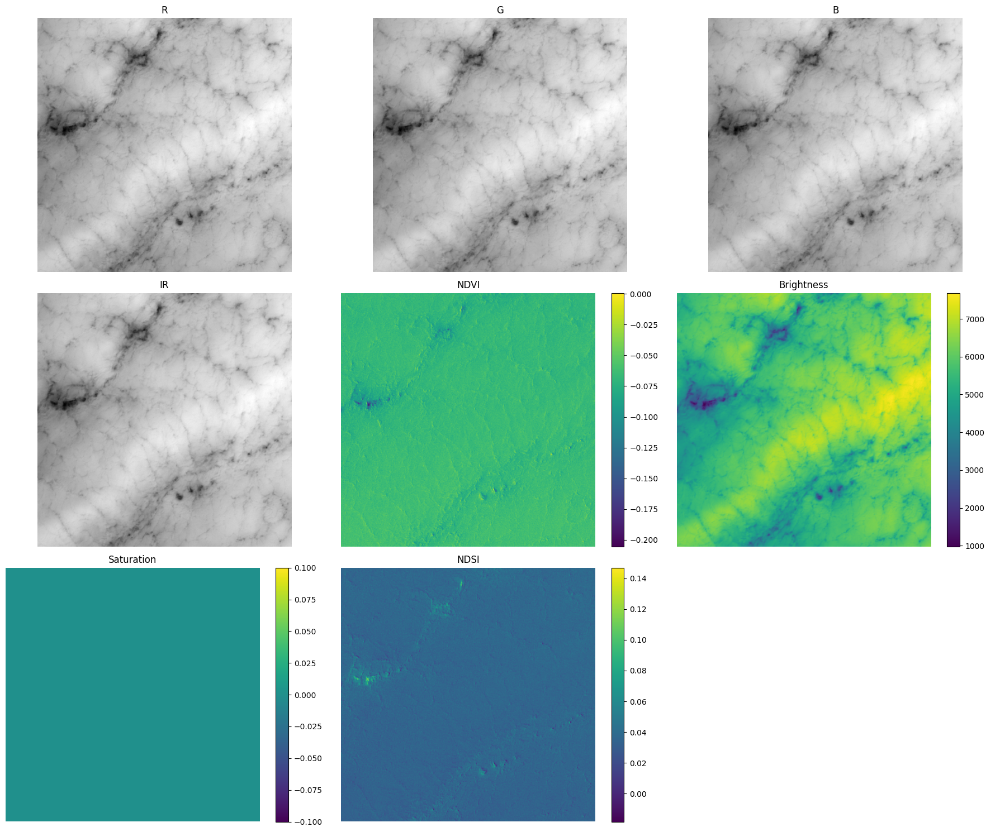

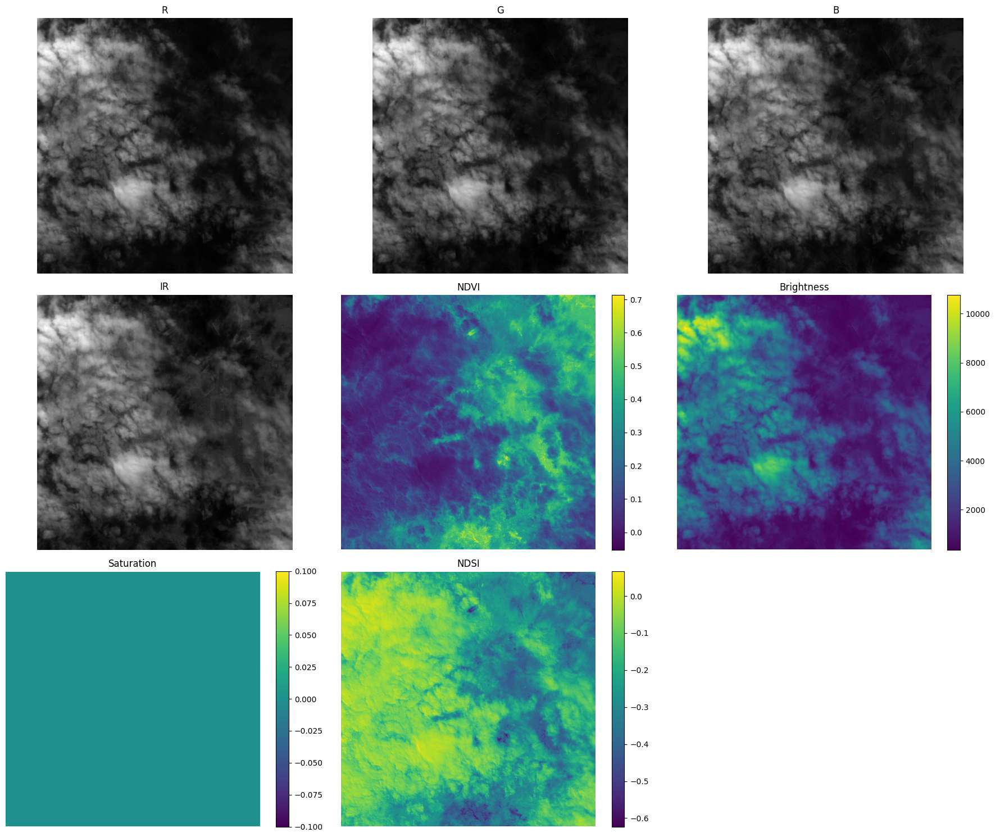

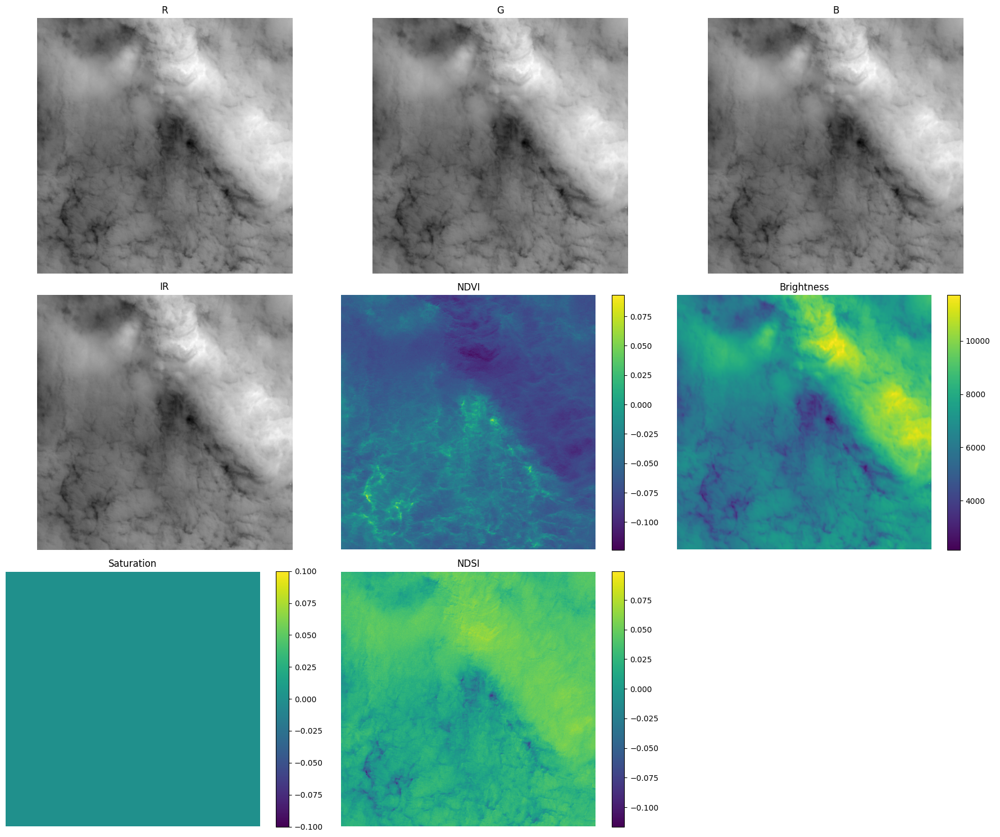

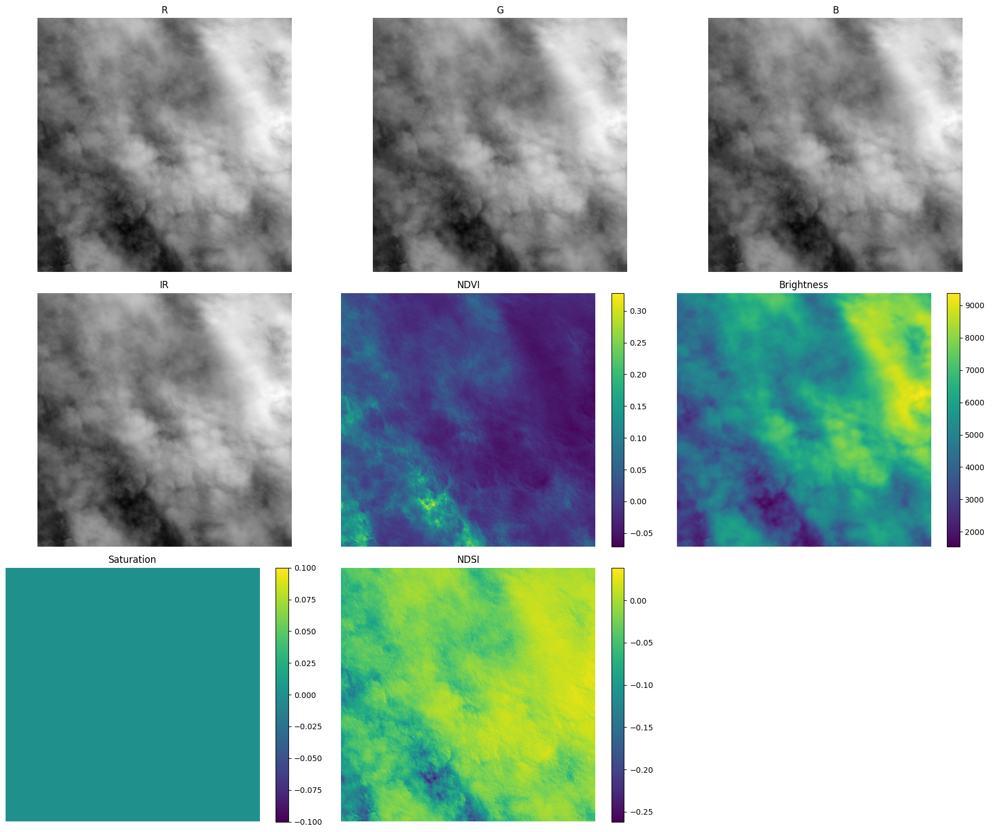

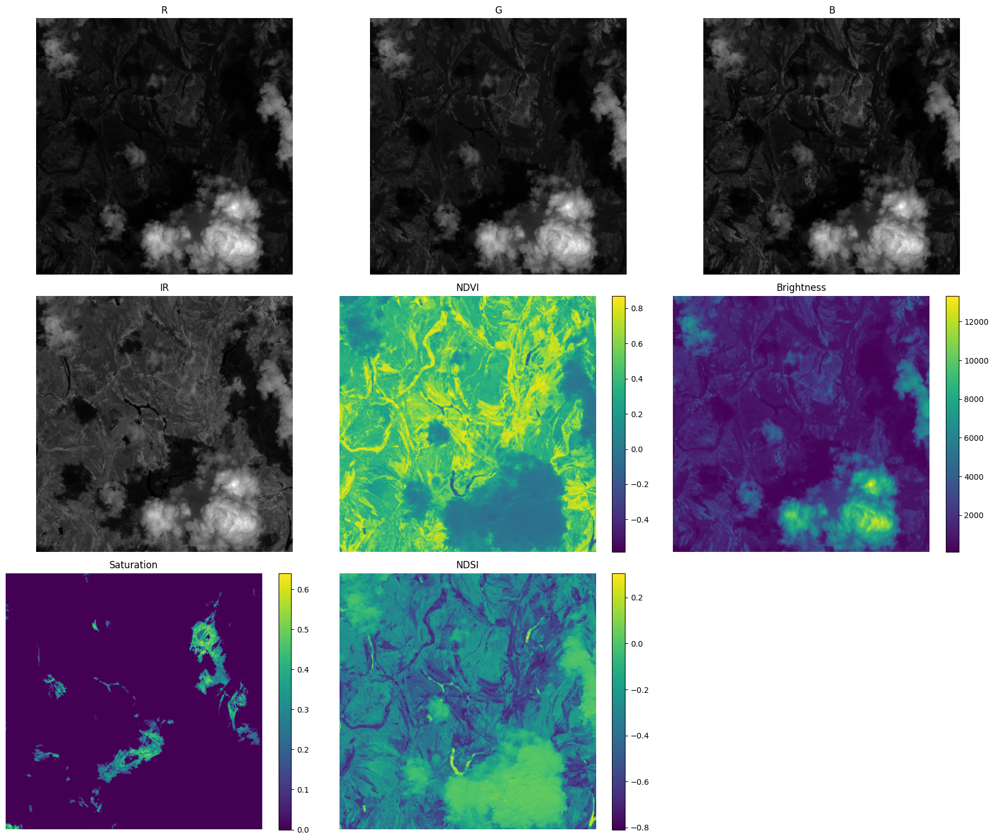

In [25]:
data_files = utilities.filterDataset('cleaned')
for f in random.sample(data_files, 5):
    img = load_image('dataset/data/' + f) 
    img = np.transpose(img, (1, 2, 0))  # (H, W, 4)
    visualize_features(img)

### Feature Selection

We will use PCA to see if some features are correlated and carry redundant information, and reduce the dimension of our feature space 

In [23]:
def fitPCA(ipca, scaler, batch_size, image_files):
    for i in tqdm(range(0, len(image_files), batch_size), desc="Fitting PCA"):
        batch_files = image_files[i:i+batch_size]

        for image_file in batch_files:
            try:
                image_path = 'dataset/data/' + image_file
                with rasterio.open(image_path) as src:
                    image = src.read()  # shape: (4, H, W)

                # Extract pixel-wise features
                features = extract_features(image)
                pixels = features.reshape(-1, features.shape[-1])

                # Sanitize before scaling
                pixels = np.nan_to_num(pixels, nan=0.0, posinf=0.0, neginf=0.0)

                # Check if all values are still valid
                if not np.isfinite(pixels).all():
                    print(f"[Warning] Non-finite values detected before scaling in {image_file}. Skipping...")
                    continue

                scaler.partial_fit(pixels)

                # Scale and sanitize again
                scaled_pixels = scaler.transform(pixels)
                scaled_pixels = np.nan_to_num(scaled_pixels, nan=0.0, posinf=0.0, neginf=0.0)

                if not np.isfinite(scaled_pixels).all():
                    print(f"[Warning] Non-finite values detected after scaling in {image_file}. Skipping...")
                    continue

                # Fit IPCA
                ipca.partial_fit(scaled_pixels)

            except Exception as e:
                print(f"PCA.partial_fit() called enough times, Terminating...")
                break  

    return ipca

In [ ]:
# Initialize IncrementalPCA
n_components = 8  
ipca = IncrementalPCA(n_components=n_components)
scaler = StandardScaler()
batch_size = 50 
image_files = utilities.filterDataset('cleaned')
ipca = fitPCA(ipca, scaler, batch_size, image_files)

Fitting PCA:  89%|████████▊ | 163/184 [38:02<04:57, 14.18s/it]C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  89%|████████▉ | 164/184 [38:14<04:27, 13.40s/it]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  90%|████████▉ | 165/184 [38:14<02:59,  9.46s/it]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  90%|█████████ | 166/184 [38:14<02:00,  6.70s/it]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  91%|█████████ | 167/184 [38:14<01:21,  4.77s/it]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  91%|█████████▏| 168/184 [38:15<00:54,  3.41s/it]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  92%|█████████▏| 169/184 [38:15<00:37,  2.49s/it]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  92%|█████████▏| 170/184 [38:15<00:25,  1.82s/it]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  93%|█████████▎| 171/184 [38:16<00:17,  1.36s/it]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  93%|█████████▎| 172/184 [38:16<00:12,  1.03s/it]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  94%|█████████▍| 173/184 [38:16<00:08,  1.24it/s]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  95%|█████████▍| 174/184 [38:16<00:06,  1.55it/s]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  95%|█████████▌| 175/184 [38:17<00:04,  1.89it/s]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  96%|█████████▌| 176/184 [38:17<00:03,  2.23it/s]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  96%|█████████▌| 177/184 [38:17<00:02,  2.54it/s]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  97%|█████████▋| 178/184 [38:17<00:02,  2.84it/s]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  97%|█████████▋| 179/184 [38:18<00:01,  3.08it/s]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  98%|█████████▊| 180/184 [38:18<00:01,  3.21it/s]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  98%|█████████▊| 181/184 [38:18<00:00,  3.38it/s]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  99%|█████████▉| 182/184 [38:19<00:00,  3.51it/s]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA:  99%|█████████▉| 183/184 [38:19<00:00,  3.50it/s]

PCA.partial_fit() called enough times, Terminating...


C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_incremental_pca.py:340: RuntimeWarning: invalid value encountered in sqrt
  mean_correction = np.sqrt(
Fitting PCA: 100%|██████████| 184/184 [38:19<00:00, 12.50s/it]

PCA.partial_fit() called enough times, Terminating...


In [12]:
# Save PCA and Scaler
with open('outputs/temp/scaler_model.pkl', 'wb') as f:
    pickle.dump(scaler, f)
with open('outputs/temp/pca_model.pkl', 'wb') as f:
    pickle.dump(ipca, f)

In [8]:
# Load PCA and Scaler
with open('models/scaler_model.pkl', 'rb') as f:
    scaler = pickle.load(f)
with open('models/pca_model.pkl', 'rb') as f:
    ipca = pickle.load(f)

In [9]:
explained_variance = ipca.explained_variance_ratio_
print(explained_variance)

[6.83330107e-01 2.12340765e-01 9.60094585e-02 4.57441468e-03
 2.89251803e-03 7.75611824e-04 7.67475989e-05 1.50008676e-07]


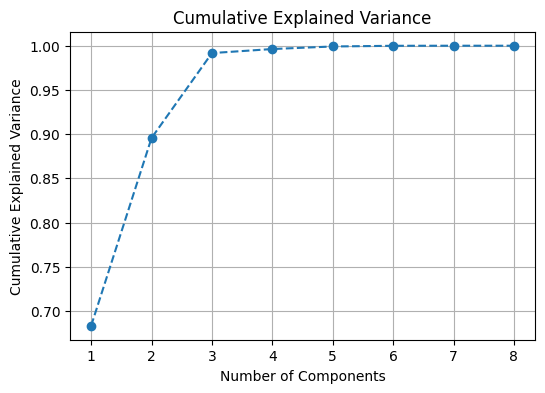

In [10]:
# Create a scree plot
cumulative_explained_variance = np.cumsum(explained_variance)
plt.figure(figsize=(6, 4))
plt.plot(range(1, len(explained_variance) + 1), cumulative_explained_variance, marker='o', linestyle='--')
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

We will select the first 3 components

### Model Training and Evaluation

In [24]:
image_files = sorted([os.path.join('dataset/data', f) for f in utilities.filterDataset('cleaned')])
mask_files = sorted([os.path.join('dataset/masks', f) for f in utilities.filterDataset('cleaned')])

# Shuffle and split
combined = list(zip(image_files, mask_files))
np.random.seed(42)
np.random.shuffle(combined)
image_files, mask_files = zip(*combined)

train_imgs, test_imgs, train_masks, test_masks = train_test_split(image_files, mask_files, test_size=0.2, random_state=42)

print(f"Train: {len(train_imgs)} images, Test: {len(test_imgs)} images")

Train: 7340 images, Test: 1836 images


In [12]:
sgd_model = SGDClassifier(loss='log_loss', max_iter=1, learning_rate='optimal', tol=None, random_state=42)
classes = np.array([0, 1])
save_dir = "outputs/temp"

In [13]:
def evaluate(model, img_list, mask_list, scaler, ipca):
    scores = []

    for img_path, mask_path in tqdm(zip(img_list, mask_list), total=len(img_list), desc=f"Evaluating"):
        # Load image and mask
        img = load_image(img_path)
        mask = load_mask(mask_path)

        # Extract features
        features = extract_features(img)
        features = features.reshape(-1, features.shape[-1])
        mask = mask.reshape(-1)

        # Scale and PCA transform
        scaled_features = scaler.transform(features)
        pca_features = ipca.transform(scaled_features)[:, :3]  # Select first 3 components

        # Predict
        preds = model.predict(pca_features)

        # Compute Dice score for this image
        score = dice_coefficient(preds, mask)
        scores.append(score)

    # Compute average Dice score across all images
    avg_score = np.mean(scores)

    print(f"Average Dice Score: {avg_score:.4f}")
    return avg_score

In [14]:
def infer_and_plot(model, scaler, pca, img_path, mask_path):
    # Load image and mask
    img = load_image(img_path)    # Expected shape: (4, H, W)
    mask = load_mask(mask_path)   # Expected shape: (H, W)

    # Extract features
    features = extract_features(img)  # Shape: (H, W, num_features)

    # Prepare features for model
    H, W, _ = features.shape
    features_flat = features.reshape(-1, features.shape[-1])

    # Scale and apply PCA (only first 3 components if needed)
    features_scaled = scaler.transform(features_flat)
    features_pca = pca.transform(features_scaled)[:, :3]  # Select first 3 components

    # Predict
    preds = model.predict(features_pca)
    pred_mask = preds.reshape(H, W)
    mask = mask.reshape(H, W)

    # Plot input image, ground truth mask, and predicted mask
    _, axs = plt.subplots(1, 3, figsize=(15, 5))

    # Plot RGB image (normalize for visualization)
    rgb_img = img[:3, :, :].transpose(1, 2, 0)

    axs[0].imshow(rgb_img / np.max(rgb_img))
    axs[0].set_title("Input RGB Image")
    axs[0].axis('off')

    axs[1].imshow(mask, cmap='gray')
    axs[1].set_title("Ground Truth Mask")
    axs[1].axis('off')

    axs[2].imshow(pred_mask, cmap='gray')
    axs[2].set_title("Predicted Mask")
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()

In [86]:
for idx, (img_path, mask_path) in enumerate(tqdm(zip(train_imgs, train_masks), total=len(train_imgs), desc="Training")):
    
    img = load_image(img_path)
    mask = load_mask(mask_path)
    features = extract_features(img)

    features = features.reshape(-1, features.shape[-1])
    mask = mask.reshape(-1)

    # Apply PCA transformation using the fitted IncrementalPCA
    scaled_features = scaler.transform(features)
    pca_features = ipca.transform(scaled_features)[:, :3] # Select first 3 components
    # ---- Train SGDClassifier ----
    if idx == 0:
        sgd_model.partial_fit(pca_features, mask, classes=classes)
    else:
        sgd_model.partial_fit(pca_features, mask)

Training: 100%|██████████| 7340/7340 [38:29<00:00,  3.18it/s]  


In [ ]:
# Save the trained SGDClassifier model
with open(os.path.join(save_dir, 'pca_sgd_model.pkl'), 'wb') as f:
    pickle.dump(sgd_model, f)

In [16]:
# Load SGD model
with open('models/pca_sgd_model.pkl', 'rb') as f:
    sgd_model = pickle.load(f)

In [ ]:
print("\n--- Final Test Evaluation ---")
sgd_test_score = evaluate(sgd_model, test_imgs, test_masks, scaler, ipca)


--- Final Test Evaluation ---


Evaluating: 100%|██████████| 1836/1836 [06:06<00:00,  5.01it/s]

Average Dice Score: 0.6842


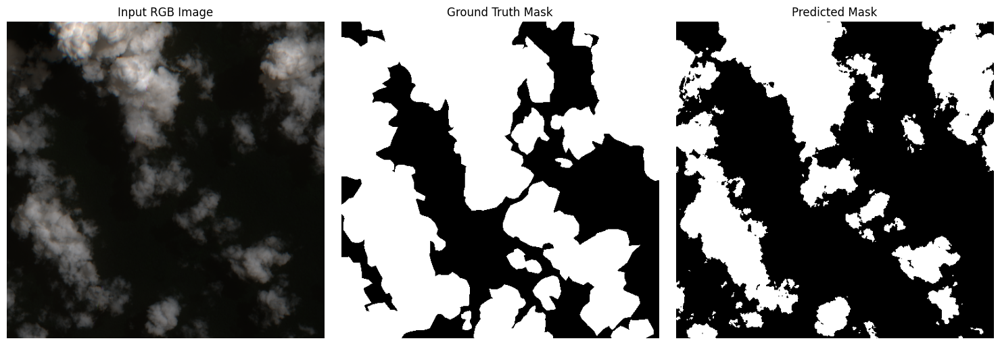

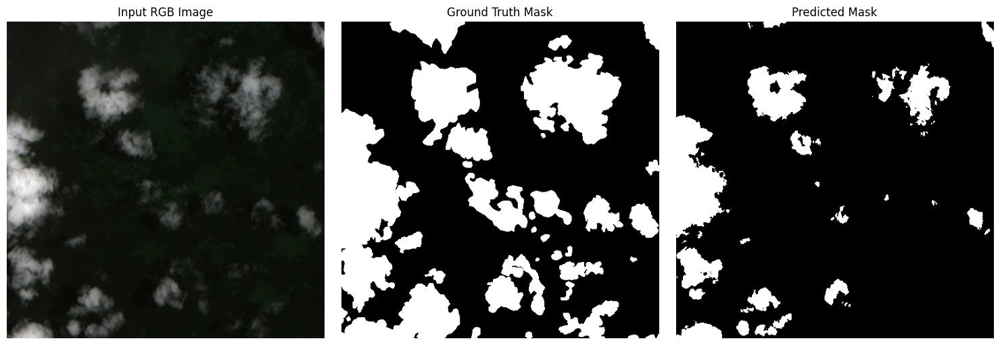

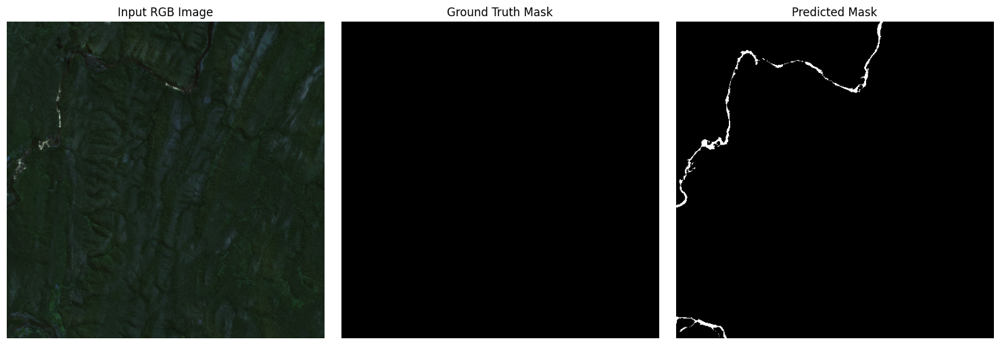

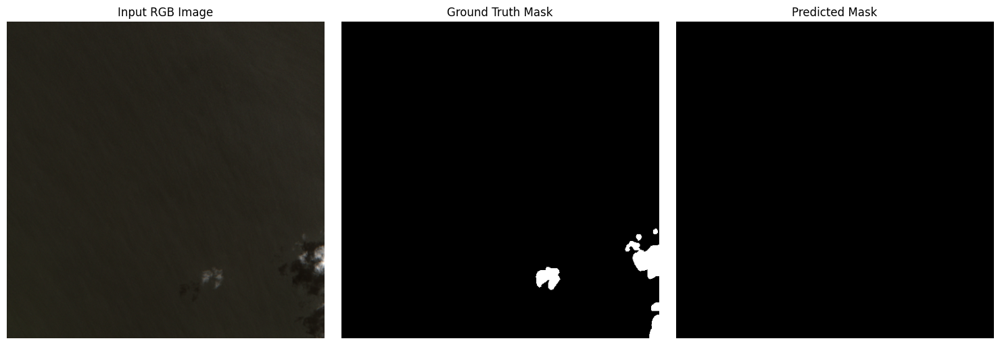

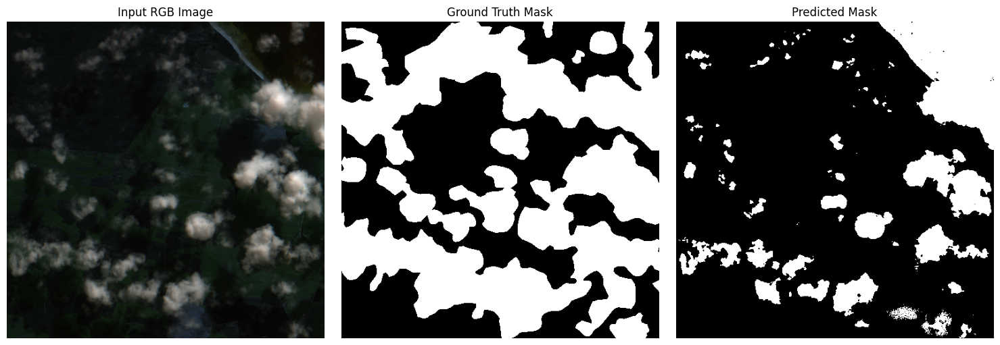

In [17]:
data_files = utilities.filterDataset('cleaned')
for f in data_files[5:10]:
    infer_and_plot(sgd_model, scaler, ipca, 'dataset/data/' + f, 'dataset/masks/' + f)

Now Let's try the model without applying PCA

In [18]:
sgd_model = SGDClassifier(loss='log_loss', max_iter=1, learning_rate='optimal', tol=None, random_state=42)
classes = np.array([0, 1])

In [19]:
def evaluate(model, img_list, mask_list, model_name="Model"):
    scores = []
    
    for img_path, mask_path in tqdm(zip(img_list, mask_list), total=len(img_list), desc=f"Evaluating {model_name}"):
        img = load_image(img_path)
        mask = load_mask(mask_path)

        features = extract_features(img)
        features = features.reshape(-1, features.shape[-1])
        mask = mask.reshape(-1)

        preds = model.predict(features)

        score = dice_coefficient(preds, mask)
        scores.append(score)

    avg_score = np.mean(scores)
    print(f"{model_name} Average Dice Score: {avg_score:.4f}")
    return avg_score

In [20]:
def infer_and_plot(model, img_path, mask_path):
    """Inference on a single image and plot side-by-side input, ground truth, prediction."""

    img = load_image(img_path)
    mask = load_mask(mask_path)

    features = extract_features(img)
    H, W, _ = features.shape
    features = features.reshape(-1, features.shape[-1])

    preds = model.predict(features)
    preds = preds.reshape((H, W)) 
    mask = mask.reshape((H, W))
    rgb_img = img[:3, :, :].transpose(1, 2, 0)

    _, axs = plt.subplots(1, 3, figsize=(18, 6))

    axs[0].imshow(rgb_img / np.max(rgb_img))  
    axs[0].set_title('Input Image')
    axs[0].axis('off')

    axs[1].imshow(mask, cmap='gray')
    axs[1].set_title('Ground Truth Mask')
    axs[1].axis('off')

    axs[2].imshow(preds, cmap='gray')
    axs[2].set_title('Predicted Mask')
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()


In [56]:
for idx, (img_path, mask_path) in enumerate(tqdm(zip(train_imgs, train_masks), total=len(train_imgs), desc="Training")):
    
    img = load_image(img_path)
    mask = load_mask(mask_path)
    features = extract_features(img)

    features = features.reshape(-1, features.shape[-1])
    mask = mask.reshape(-1)

    # ---- Train SGDClassifier ----
    if idx == 0:
        sgd_model.partial_fit(features, mask, classes=classes)
    else:
        sgd_model.partial_fit(features, mask)

Training: 100%|██████████| 7340/7340 [28:03<00:00,  4.36it/s] 


In [ ]:
with open(os.path.join(save_dir, 'sgd_model.pkl'), 'wb') as f:
    pickle.dump(sgd_model, f)

In [21]:
with open('models/sgd_model.pkl', 'rb') as f:
    sgd_model = pickle.load(f)

In [74]:
evaluate(sgd_model, test_imgs, test_masks)

Evaluating Model: 100%|██████████| 1836/1836 [02:43<00:00, 11.25it/s]

Model Average Dice Score: 0.7143


0.7142874431836561

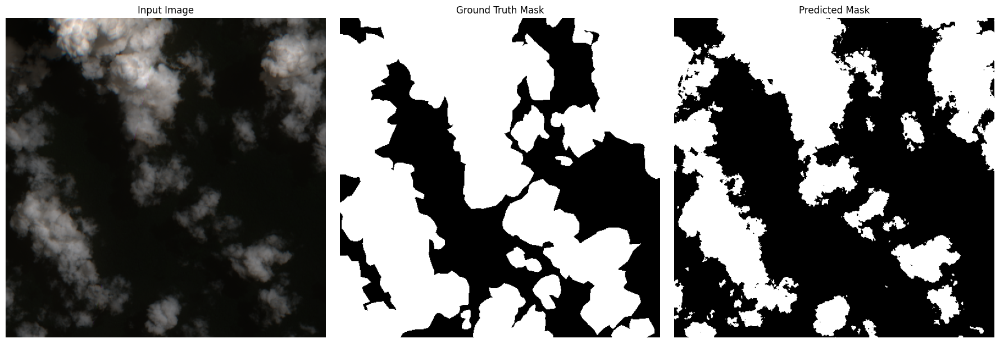

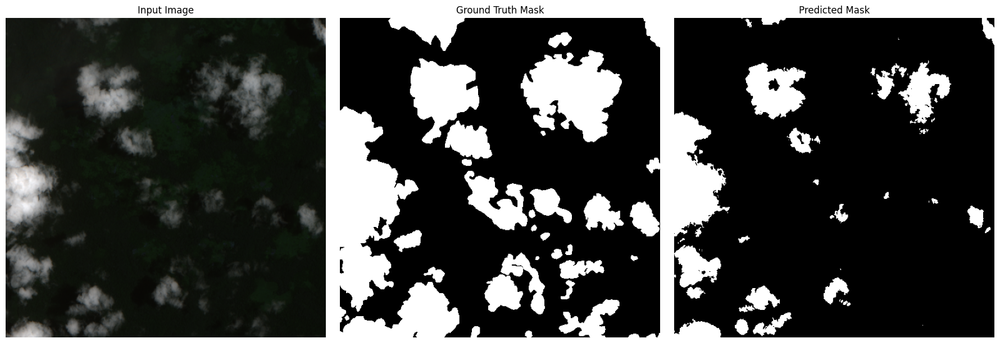

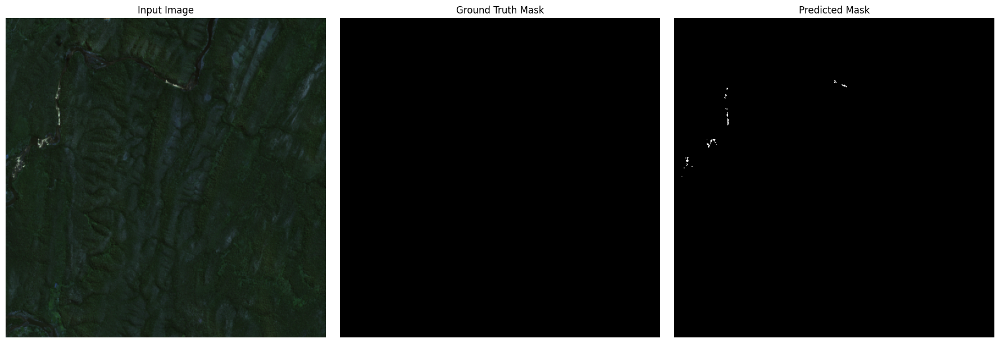

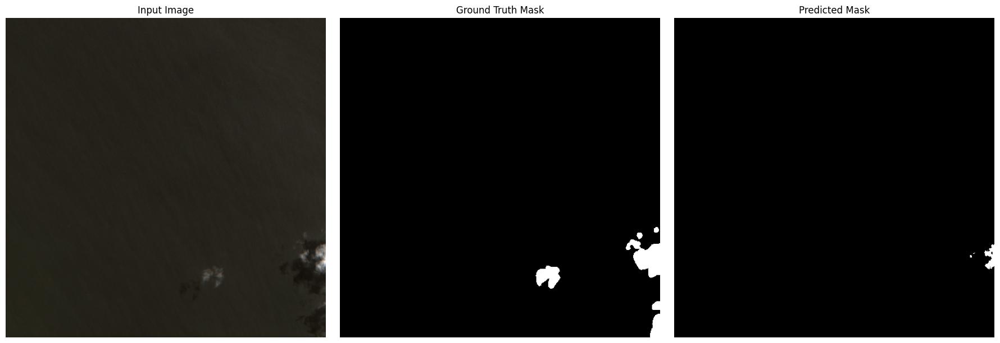

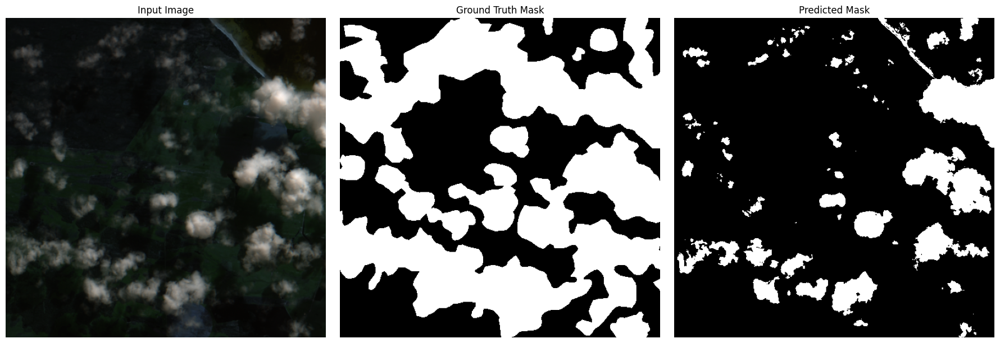

In [22]:
data_files = utilities.filterDataset('cleaned')
for f in data_files[5:10]:
    infer_and_plot(sgd_model, 'dataset/data/' + f, 'dataset/masks/' + f)

It seems that some of the features we dropped carry useful information